<h1 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">AIming To Win: A Deep Learning Take on CSGO Player Detection Model</h1>

by James Verdan on June 12, 2023 using PyTorch and Hugging Face

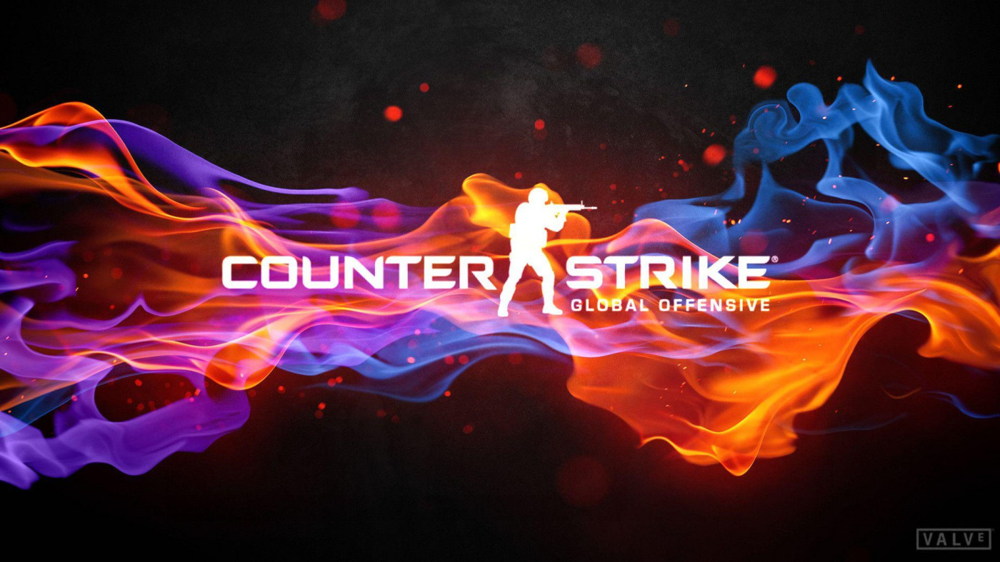

Artificial Intelligence (AI) and Gaming is such a perfect pair due to two reasons: the vast amount of data sourced from the game that can be used to train AI models and algorithms, and the variety of applications AI can be utilized in gaming such as Game Testing, Cheat Detection, Non-playable Character Modelling, etc. The current advances in AI has now revolved into Deep Learning which uses deep neural networks with multiple layers. These layers are a kind of computational model inspired by the human brain and are used to analyze various factors with a complex structure. Deep Learning techniques are especially useful when dealing with unstructured data, such as images, text, or sound which gaming encompasses. In this notebook, we look at how Deep Learning models can have a high impact on a popular game which is CSGO. 

Counter-Strike: Global Offensive or most commonly known as CSGO, is a popular online multiplayer first-person shooter video game developed by Valve Corporation and Hidden Path Entertainment. It's the fourth game in the Counter-Strike series and was released in August 2012. It remains an extremely popular game in 2023, both in terms of active players and viewership on platforms like Twitch and YouTube.

The game pits two teams against each other: the Terrorists and the Counter-Terrorists. The objective varies depending on the game mode but generally involves completing objectives or eliminating the enemy team. Completing these objectives, especially in high level gameplay and in the professional scene, requires pinpoint accuracy not just in aiming and shooting your opponents. The accuracy should extend to the identification of the opponent which can be challenging due to terrain or maps and the strategy. The player should be recognized even if only a portion of the body is shown since this may be the only chance to eliminate the opponent. [1]

The notebook aims to showcase two deep learning models, a player detection which takes a csgo screenshot image as input and outputs the same image but overlays a bounding box on the detected player while indicating a confidence value (0 - 1) of the detected object as a player. The next model is to classify the images detected in the first model into which team the player is in, basing on a manually labeled ground truth of the images.

**Setting Up**

But before starting, the following modules to be used needs in the models needs to be installed:
- python standard libraries (numpy, os, shutil, matplotlib)
- transformers
- pytorch
- torchvision
- PIL

In [1]:
# pip install transformers
# pip install pytorch
# pip install torchvision
# pip install PIL

If needed, permissions must be set and allowed to avoid any error in running the whole notebook. Address of the os.environ must be set accordingly to the user.

In [2]:
# If experiencing permission error, run this code, otherwise exclude when running

import os, shutil
os.environ['XDG_CACHE_HOME'] = '/home/msds2023/jverdan/.cache'
os.environ['HUGGINGFACE_HUB_CACHE'] = '/home/msds2023/jverdan/.cache'

Lastly, ensuring that pytorch is using GPU when training the model to avoid very long training time.

In [3]:
import torch

# Check if machine is using GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">The CSGO Dataset</h2>

The dataset set is collection of in-game images of csgo matches from https://universe.roboflow.com/asd-culfr/wlots/dataset/1. The dataset contains ~4500 images which is divided into train, validation and test sets which includes different angles of the game. The dataset contains images of different player perspective with majority being the first person point of view of the player while others are close-up look of the player. There are also images that show player being far to the point that it is barely visible and pixelated while others include only the body parts of the player. Initial preprocessing of the dataset included applied auto-orient, resizing of image to 416x416. Augmentation of the images include 3 outputs per training example and setting of brightness between -15% and +15%.

For reference, here is a sample image in the dataset:

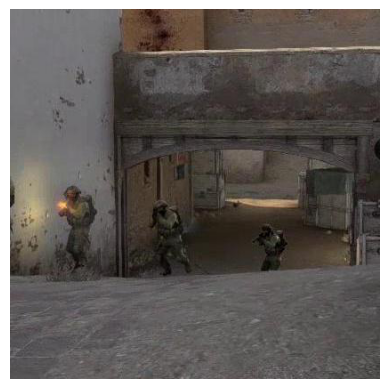

In [4]:
from PIL import Image
import matplotlib.pyplot as plt
image_filepath = './data1/test/704_jpg.rf.a91b8cb8a4159eb47ced84049a7ee088.jpg'
image = Image.open(image_filepath)

plt.imshow(image)
plt.axis('off')
plt.show()

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">Enemy Spotted (Player Model Detection Model)</h2>

The initial step is to detect a player regardless of which team it is. This is a crucial step since there are a lot of objects in the game's environment such as boxes, animals, vehicles, etc. Conveniently, a pre-trained model for this process is already available. A pre-trained model is a model that has been previously trained on a large dataset, often on a large-scale machine learning task. The benefit of a pre-trained model is that it can be used as a starting point for similar tasks, potentially saving significant computational resources and time.

For this task, You Only Look Once (YOLO) will be used which is a real-time object detection system that is known for its ability to identify objects in images and videos quickly and accurately. Traditional object detection systems might involve several steps, such as generating a bunch of potential bounding boxes in an image and then running a classifier on each one to see whether it contains an object. The name "You Only Look Once" refers to the fact that this system takes a single look at the image and predicts what objects are present and where they are.

It does this by dividing the image into a grid. Each cell in the grid is responsible for predicting a certain number of bounding boxes and class probabilities. These predictions are made all at once (hence, "you only look once") using a single neural network, making YOLO much faster than many other object detection systems. [2]

A sample architecture is shown below:

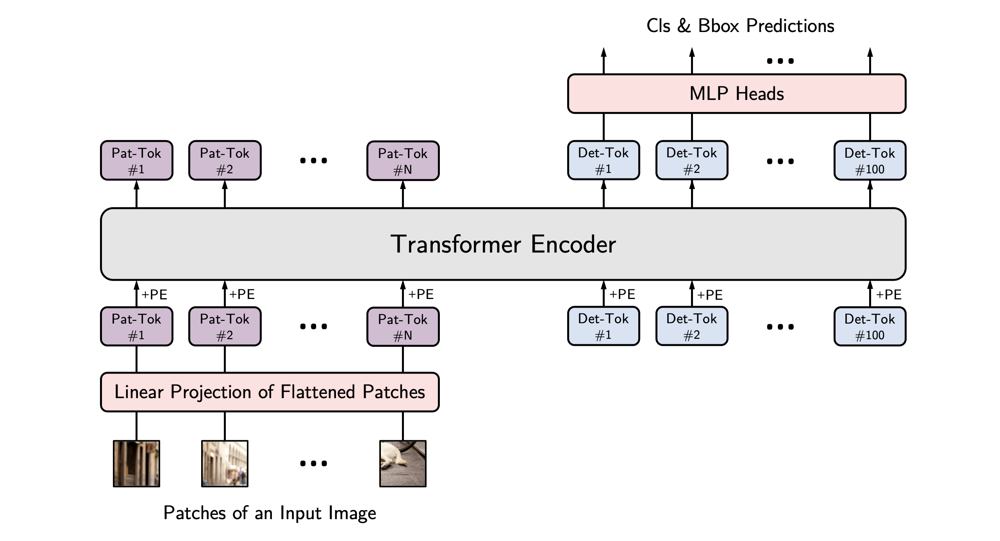

Next is to prepare the inputs by processing an image or a list of images and returning the result in Pytorch tensors (pt). The preprocessed inputs are passed to the model which outputs the predictions of the different identfied objects. lastly, extracting the specific output values from the model inference: the class predictions for each bounding box (indicating the type of object each box contains), and the predicted bounding box coordinates.

In [5]:
from transformers import YolosFeatureExtractor, YolosForObjectDetection

feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')
model = YolosForObjectDetection.from_pretrained('hustvl/yolos-tiny')

inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)

# model predicts bounding boxes and corresponding COCO classes
logits = outputs.logits
bboxes = outputs.pred_boxes

2023-06-12 15:01:09.002372: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/msds2023/jverdan/.local/lib/python3.10/site-packages/transformers/models/yolos/feature_extraction_yolos.py:28: FutureWarning: The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.
  warnings.warn(
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


The next step is to process the output based on the COCO API. A tensor is created to properly scale the bounding box coordinates that the model outputs. Then lastly, converting the raw outputs of the model into a more useful format, scaling the bounding box coordinates to correctly overlay the resulting bounding boxes to the image.

In [6]:
# convert outputs (bounding boxes and class logits) to COCO API
target_sizes = torch.tensor([image.size[::-1]])
results = feature_extractor.post_process_object_detection(outputs, 
                                            target_sizes=target_sizes)[0]

### Testing on Single Image

After setting up the algorithm, the model is tested on a single image to check the results. The code below filters the object detected to only `person` since the player models of CSGO are actual people. The next filter is setting the minimum threshold to limit the model outputs based on the confidence of the results. For now, it is set to 0.80 since only one image is being observed. Lastly, the resulting bounding boxes plus its confidence value is overlayed to the sample image.

Detected person with confidence 0.979 at location [272.59, 241.69, 307.68, 295.9]
Detected person with confidence 0.917 at location [155.07, 214.38, 198.07, 301.0]
Detected person with confidence 0.967 at location [54.73, 198.2, 94.75, 298.15]


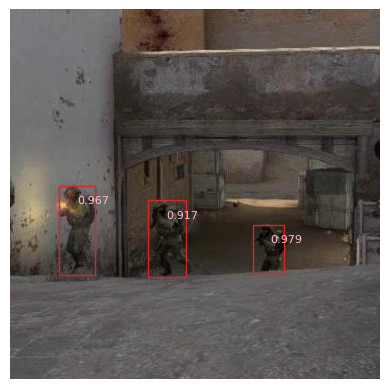

In [7]:
from matplotlib.patches import Rectangle

# Set minimum confidence threshold
confidence = 0.8

# Identify objects in the image
objects = {'labels': [], 'scores': [], 'boxes': []}

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    # let's only keep detections with score > 0.9
    if score > confidence:
        label_name = model.config.id2label[label.item()]
        if label_name == 'person':
            print(
                f"Detected {label_name} with confidence "
                f"{round(score.item(), 3)} at location {box}"
            )
            objects['labels'].append(label_name)
            objects['scores'].append(round(score.item(), 3))
            objects['boxes'].append(box)
            
fig, ax = plt.subplots()

ax.imshow(image)
for index, box in enumerate(objects['boxes']):
    x1, y1, x2, y2 = box
    width = x2 - x1
    height = y2 - y1
    rectangle = Rectangle((x1, y1), width, height, fill=False, ec='tab:red')
    ax.text(x1+20, y1+20, objects['scores'][index], fontsize=8, color='pink')
    ax.add_patch(rectangle)

ax.axis('off')
plt.show()

The output of the model correctly predicts the three player models in the image with high confidence.

### Checking Players on Whole Dataset

Since the model was able to predict the desired player models from the single image, it can now be tested on the dataset. However for the purpose of this notebook, the model will be subjected to only the test dataset to avoid long run times. But if need be, the model can be run through the whole dataset to increase the number of images that can be used in the succeeding model. After going through the whole test set, the resulting image with the bounding boxes and confidence values is shown below. Also, the number of player models that model detected is counted for reference.

For the confidence interval, it is set to 0.50 to maximize the "person" it detected. This is because the images contain player models that either far from the point of view of the image as well as portion of the player model instead of the whole player.

Model detected 1 player/s in the image


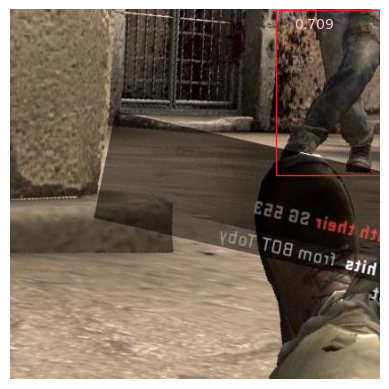

Model detected 4 player/s in the image


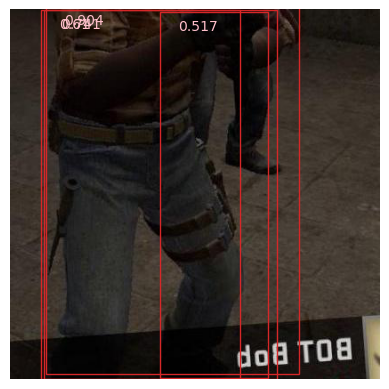

Model detected 1 player/s in the image


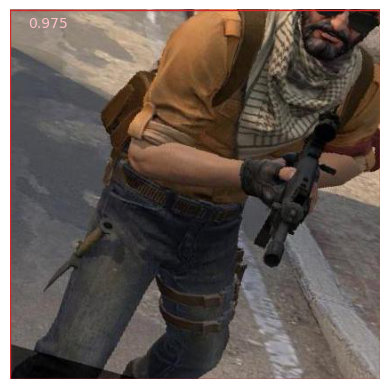

Model detected 1 player/s in the image


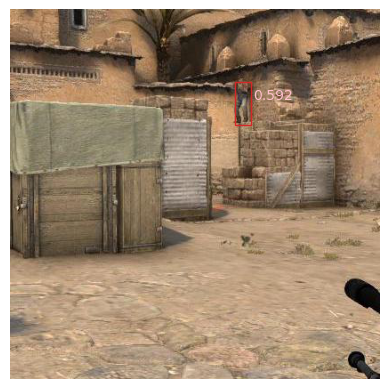

Model detected a total of 258 players in the dataset


In [8]:
# Loop Through each pic to ensure all faces are detected

lst = next(os.walk('./data1/test/'))[2]
num_pic = len(lst)
face_count = 0

for num, i in enumerate(lst):
    image_filepath = f'./data1/test/{i}'
    image = Image.open(image_filepath)
    
    feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')
    model = YolosForObjectDetection.from_pretrained('hustvl/yolos-tiny')
    
    inputs = feature_extractor(images=image, return_tensors="pt")
    outputs = model(**inputs)

    # model predicts bounding boxes and corresponding COCO classes
    logits = outputs.logits
    bboxes = outputs.pred_boxes
    
    target_sizes = torch.tensor([image.size[::-1]])
    results = feature_extractor.post_process_object_detection(outputs, 
                                                target_sizes=target_sizes)[0]
    
    
    confidence = 0.5
    
    # Identify objects in the image
    objects = {'labels': [], 'scores': [], 'boxes': []}

    for score, label, box in zip(results["scores"], results["labels"], 
                                 results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        # let's only keep detections with score > 0.5
        if score > confidence:
            label_name = model.config.id2label[label.item()]
            if label_name == 'person':
                objects['labels'].append(label_name)
                objects['scores'].append(round(score.item(), 3))
                objects['boxes'].append(box)
                face_count += 1

    # Identify objects in the image
    fig, ax = plt.subplots()
    
    player = 0
    for index, box in enumerate(objects['boxes']):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1
        rectangle = Rectangle((x1, y1), width, height, fill=False, 
                              ec='tab:red')
        ax.text(x1+20, y1+20, objects['scores'][index], fontsize=10, 
                color='pink')
        ax.add_patch(rectangle)
        player += 1
        
    # Show the first five results of the model    
    if 5 < num < 10:
        print(f'Model detected {player} player/s in the image')
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    else:
        plt.close()
print(f'Model detected a total of {face_count} players in the dataset')

Visualizing the results of the model, it can be observed that players are detected with high enough confidence. Like in the first image, the model still detected the player model even if it is only the legs that are shown and in the fifth image where the player is camouflaged in the environment so the confidence is low. However the models does not perfectly identify every player models. There are images where it does not detect any player even if it is clearly shown in the image and there are instances like in the second image that the model detects the same player twice.

### Cropping the Output Player Models

In preparation for the team classifier model, the output of the player detection model is cropped from the original image. The cropped images is saved into a directory since it will be used in the next model. Below are samples of the cropped images:

In [9]:
# Loop Through each image, crop each face and save in a folder

if os.path.exists('./img_crop'):
    # if existing, delete dir to reset
    shutil.rmtree('./img_crop')
os.makedirs('./img_crop')

face_crop = 0

for index, i in enumerate(lst):
    image_filepath = f'./data1/test/{i}'
    image = Image.open(image_filepath)
    
    feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')
    model = YolosForObjectDetection.from_pretrained('hustvl/yolos-tiny')
    
    inputs = feature_extractor(images=image, return_tensors="pt")
    outputs = model(**inputs)

    # model predicts bounding boxes and corresponding COCO classes
    logits = outputs.logits
    bboxes = outputs.pred_boxes
    
    target_sizes = torch.tensor([image.size[::-1]])
    results = feature_extractor.post_process_object_detection(outputs, 
                                             target_sizes=target_sizes)[0]
    
    
    confidence = 0.5
    
    # Identify objects in the image
    objects = {'labels': [], 'scores': [], 'boxes': []}

    for score, label, box in zip(results["scores"], results["labels"], 
                                 results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        # let's only keep detections with score > 0.9
        if score > confidence:
            label_name = model.config.id2label[label.item()]
            if label_name == 'person':
                objects['labels'].append(label_name)
                objects['scores'].append(round(score.item(), 3))
                objects['boxes'].append(box)
                
                
    for index2, box in enumerate(objects['boxes']):
        x = image.crop(box)
        x.save(f'./img_crop/img{index}_face{index2}.jpg', format='jpeg')
        face_crop += 1
        
print(f'Model cropped {face_crop} face/s')

Model cropped 258 face/s


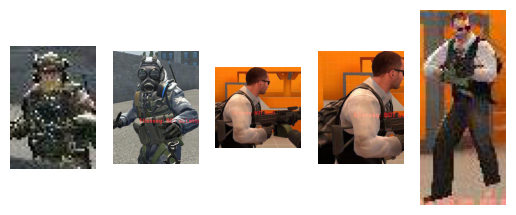

In [10]:
lst2 = next(os.walk('./img_crop/'))[2]
num_pic2 = len(lst2)

fig, ax = plt.subplots(1, 5)
for num, i in enumerate(lst2[15:20]):
    image_filepath = f'./img_crop/{i}'
    image = Image.open(image_filepath)
    ax[num].imshow(image)
    ax[num].axis('off')

plt.show()

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">Choose Your Team (Team Classifier Model)</h2>

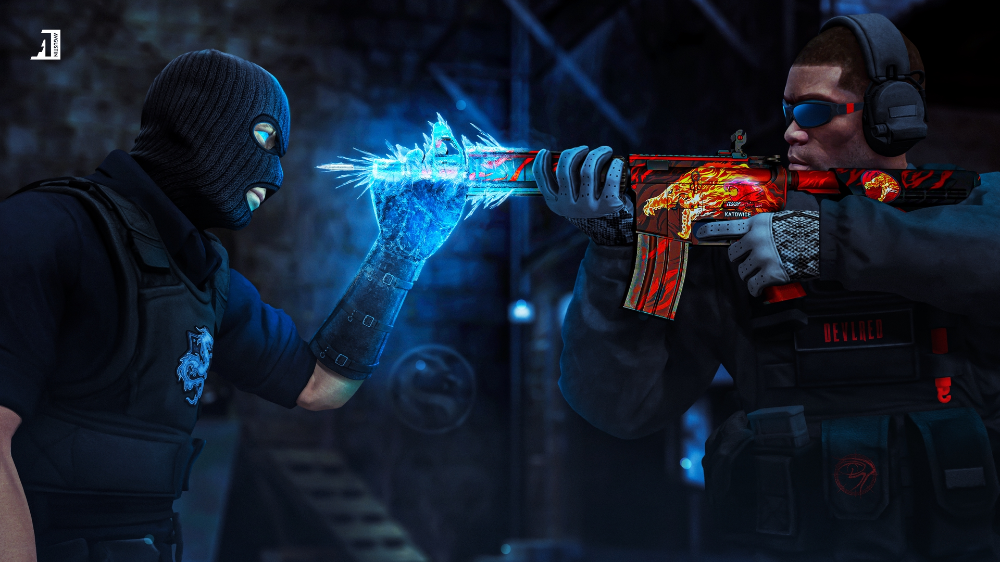

Since the game of CSGO is divided into two teams, it is not enough to detect the players in the images. It is important to know which team the players belongs to due to two main reasons: friendly fire and saving resources. Friendly fire is a gameplay mechanic when a player inflicts damage on his teammates, either by mistake or intentionally. Saving resources is also important since players can only buy during the start of the round and are limited on what they can afford and what they purchase. 

For this model, the player models will be classied as `ct` for counter terrorists and `t` for terrorists which are the official team names of the game. In the models are classified based on two factors, the objective of the team (which will not be covered since it does not involve images) and the cosmetics of the player models. Counter terrorist are visualized as army infrantries or SWAT squad with the camouflage and battlefield equipment while terrorist are those with casual clothes with ski masks or limited body armor.

**Setting up**

In preparation of the classifier model, the output cropped images are manually tagged as either `ct`, `t`, or neither to establish the ground truth of the images. The neither tagging are comprised of the images that cannot be distinguised between the two team such as overly pixelated images and images that only include guns since the model correctly identified them as part of the player. The images moved to two separate folders per team, the duplicates were removed and the number of images per team is limited to decrease run time of training the model.

### Data Loading and Segmentation

To initialize the classifier, the dataset of the cropped images of the previous model needs to be split into train, validation and test sets for training and evaluation of the model. For the case of image models, each class needs to have its own train-val-test sets so that the model can learn the behavior and features of each class. 

The selection of the images for each set is fixed for simplicity and to easily reproduce the results. The distribution of the dataset is also fixed where the first 60% of the dataset will be the training set, the next 20% images are for validation and the last 20% images are the test set.

The sample images are shown below as well as the number of each set. Note that there is a slight imbalance since the dataset is comprised of 55 `ct` images and 62 `t` images. However the imbalance is minor enough so it is not dealt with.

In [11]:
team = ['ct', 't']

In [12]:
# # For renaming images per class, run only once
# for class_ in team:
#     folder = "./model_class"+'/'+class_
#     for count, filename in enumerate(next(os.walk(folder))[2]):
#         if filename.endswith('.jpg'):
#             dst = f"{class_} ({str(count)}).jpg"
#             src =f"{folder}/{filename}"
#             dst =f"{folder}/{dst}"
#             os.rename(src, dst)

In [13]:
# this function can be used to copy images to train, validation, and test dirs
def create_dataset(src, dst, range_, class_):
    """Copy images of class class_ within range_ from src to dst.
    
    Parameters
    ----------
    src : str
        source directory
    dst : str
        destination directory
    range_ : tuple
        tuple of min and max image index to copy
    class_ : str
        image class 
    """
    if os.path.exists(dst):
        # if existing, delete dir to reset
        shutil.rmtree(dst)
    os.makedirs(dst)
    fnames = [f'{class_} ({i}).jpg' for i in range(*range_)]
    for fname in fnames:
        src_file = os.path.join(src, fname)
        dst_file = os.path.join(dst, fname)
        shutil.copyfile(src_file, dst_file)

In [14]:
# looping through create_dataset for each class

for class_ in team:
    src = './model_class' # source file
    
    if class_ == 'ct':
    
        dst = f'./model_class/train/{class_}' # train
        create_dataset(src+'/'+class_, dst, range_=(0, 33), class_=class_)

        dst = f'./model_class/validation/{class_}' # val
        create_dataset(src+'/'+class_, dst, range_=(33, 44), class_=class_)

        dst = f'./model_class/test/{class_}' # test
        create_dataset(src+'/'+class_, dst, range_=(44, 55), class_=class_)
        
    else:
        dst = f'./model_class/train/{class_}' # train
        create_dataset(src+'/'+class_, dst, range_=(0, 38), class_=class_)

        dst = f'./model_class/validation/{class_}' # val
        create_dataset(src+'/'+class_, dst, range_=(38, 50), class_=class_)

        dst = f'./model_class/test/{class_}' # test
        create_dataset(src+'/'+class_, dst, range_=(50, 62), class_=class_)

# Set directory for each set
train_ct_dir =  './model_class/train/ct'
train_t_dir =  './model_class/train/t'

validation_ct_dir =  './model_class/validation/ct'
validation_t_dir =  './model_class/validation/t'

test_ct_dir =  './model_class/test/ct'
test_t_dir =  './model_class/test/t'

Number of total images:
total images of ct: 55
total images of t: 62


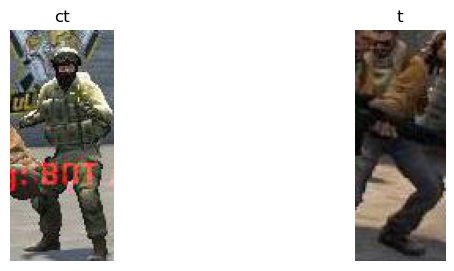

Number of training set images:
total training ct images: 33
total training t images: 38
Number of validation set images:
total validation ct images: 11
total validation t images: 12
Number of test set images:
total test ct images: 11
total test t images: 12


In [15]:
# Print the number of images for each class
print(f'Number of total images:')
for name in team:
    print(f"total images of {name}: {len(next(os.walk(f'./model_class/{name}'))[2])}")

fig, ax = plt.subplots(1, 2, figsize=(8, 3))

# Iterate over the classes
for i, name in enumerate(team):
    
    # Get the file name of the first image in the class directory
    file_name = next(os.walk(f'./model_class/train/{name}'))[2][25]
    
    # Display the image
    ax[i].imshow(Image.open(f'./model_class/train/{name}/{file_name}'))
    ax[i].axis('off')
    ax[i].set_title(f'{name}')
plt.show()

# Check values for each set
print(f'Number of training set images:')
print('total training ct images:', len(os.listdir(train_ct_dir)))
print('total training t images:', len(os.listdir(train_t_dir)))

print(f'Number of validation set images:')
print('total validation ct images:', len(os.listdir(validation_ct_dir)))
print('total validation t images:', len(os.listdir(validation_t_dir)))

print(f'Number of test set images:')
print('total test ct images:', len(os.listdir(test_ct_dir)))
print('total test t images:', len(os.listdir(test_t_dir)))


### Data Preprocessing

The next step is the preprocessing of the dataset which is different for each set. The preprocessing steps mainly involves augmenting the dataset by adding transformations especially in the training set. The goal of data augmentation is to artificially expand the size of the training dataset using transformations on the existing data. This helps to expose the model to a wider variety of data within the training set itself, which can help to improve the model's ability to generalize.

For the training set, the image is resized to 224 x 224 before converting to pytorch tensor which is required for the model selected to be trained. Then RandomHorizontalFlip transformation is done to randomly flip the image horizontally with a probability of 0.6 which simulate the appearance of new data and helps reduce overfitting. The next process is RandomPerspective which is a type of image transformation that gives the effect of viewing the image from a different angle or perspective. This transformation is achieved by mapping each point in the given image to a corresponding point in the output image as per the perspective transformation rule. The ColorJitter transformation randomly changes the brightness of the image. This helps in adding more variations to the training dataset. Lastly, the training set is normalized using the mean and standard deviation. These statistics are computed separately for each of the three color channels (assuming RGB images)

The validation and test sets are augmented the same way with just resizing the image with the same value as the train set. Then the dataset is normalize with the mean and standard deviation that was calculated.

In [16]:
from torchvision import datasets, transforms

train_dir = "./model_class/train"
data_transforms = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.ToTensor()
])
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=data_transforms)

# compute for the means and stds (for normalization)
imgs = torch.stack([img_t for img_t, _ in train_data], dim=3)
means = imgs.view(3, -1).mean(dim=1).numpy()
stds = imgs.view(3, -1).std(dim=1).numpy()

In [17]:
from torch.utils.data import DataLoader

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(size=(224,224)),
        transforms.RandomHorizontalFlip(p=0.6),             
        transforms.RandomPerspective(p=0.5),
        transforms.ColorJitter(brightness=0.5),              
        transforms.ToTensor(),                              
        transforms.Normalize(means, stds)
    ]),
    'validation': transforms.Compose([
        transforms.Resize(size=(224,224)),
        transforms.ToTensor(),                              
        transforms.Normalize(means, stds)
    ]),
    'test': transforms.Compose([
        transforms.Resize(size=(224,224)),
        transforms.ToTensor(),                              
        transforms.Normalize(means, stds)
    ])
}

data_dir = './model_class'

# loading image data using ImageFolder
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'validation', 'test']}

# dataloaders
dataloaders = {x: DataLoader(image_datasets[x], batch_size=4,
                             shuffle=True)
              for x in ['train', 'validation', 'test']}
# size of datasets
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# class names
class_names = image_datasets['train'].classes


### Training the Model

The model to be used in the classifier model is VGG-19 which is a convolutional neural network architecture named after the Visual Geometry Group from Oxford University that developed it. VGG-19 is a convolutional neural network that is trained on more than a million images from the ImageNet database. The network is 19 layers deep and can classify images into 1000 object categories, such as a keyboard, mouse, pencil, and many animals. As a result, the network has learned rich feature representations for a wide range of images. The layers are comprised of 16 convolution layers, 3 Fully connected layer, 5 MaxPool layers and 1 SoftMax layer. One of the key aspects of VGG-19 is its simplicity, using only 3x3 convolutional layers stacked on top of each other in increasing depth. Reducing the volume size is handled by max pooling. Two fully-connected layers, each with 4,096 nodes are then followed by a softmax classifier. [3]

Other things to consider before training the model are the following:
- Turning off the gradient computation for all the parameters in the model to freeze the weights and biases of the pre-trained model during training. This process is called transfer learning, where you utilize a pre-trained model and adapt it to a new, but similar problem.

- Replacing the final layer, or classifier, of the pre-trained model with a layer that is suitable for the task required. For the player classification model, the last layer will be converted to a fully connected layer that takes a 512x7x7 dimensional input which is the output of the previous layer, a ReLU activation function, a dropout layer for regularization with dropout rate 0.4, and a final fully connected layer that reduces the dimension to 2, which would be the number of classes for a binary classification problem.

- Defining the loss function to be used during training. For this model, Cross entropy loss is selected since it is commonly used for classification problems.

- Defining the optimization algorithm to be used during training. The selected optimizer is Adam which is a variant of stochastic gradient descent then the learning rate is set to 0.001. Important note is only the parameters of the final classifier are being optimized since requires_grad attribute was set to False.

- Ensuring that the computation is performed using a GPU to improve the training time.

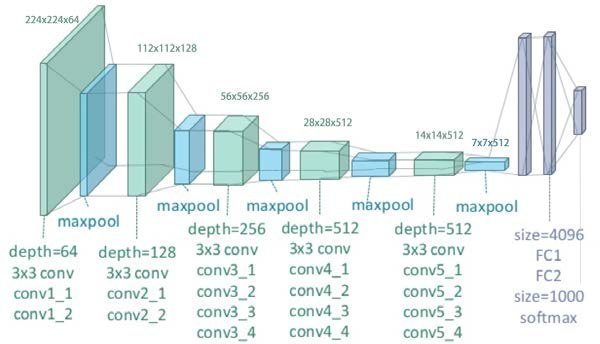

In [18]:
import torch, torchvision
from torch import nn, optim

torch.manual_seed(143)

model_conv = torchvision.models.vgg19(weights='IMAGENET1K_V1')

for param in model_conv.parameters():
    param.requires_grad = False   
    
model_conv.classifier = nn.Sequential(nn.Linear(512*7*7, 512),
                                      nn.ReLU(),
                                      nn.Dropout(0.4),
                                      nn.Linear(512, 2))

model_conv = model_conv.to(device)

# set the loss function
criterion = nn.CrossEntropyLoss()

# only the parameters of the classifier are being optimized
optimizer_conv = optim.Adam(model_conv.classifier.parameters(), lr=0.001)

The model is trained on the training set with the above parameters. The training loss and accuracy are computed and printed every 100 epochs for brevity. A copy of the of the initial model's weights is initialized and updated whenever the model achieves better performance on the validation set.

Note: Other models such as ResNet and VGG-16 are trained on the dataset but VGG-19 resulted to the highest accuracy so it is the only model shown.

In [19]:
import time, copy

# this function can be used to train the CNN model used
def train_model(model, criterion, optimizer, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        if epoch%100 == 0:
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)
        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
           
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            if epoch%100 == 0:
                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            
            # deep copy the model
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            
            if epoch%100 == 0:
                print()
                
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

# Set Seed for Reproducibility
torch.manual_seed(143)

# Train Model
model_conv = train_model(model_conv, 
                       criterion, 
                       optimizer_conv, 
                       num_epochs=500)

Epoch 0/499
----------
train Loss: 2.3391 Acc: 0.4789

validation Loss: 2.2055 Acc: 0.6087

Epoch 100/499
----------
train Loss: 0.1008 Acc: 0.9577

validation Loss: 1.5991 Acc: 0.7826

Epoch 200/499
----------
train Loss: 0.0249 Acc: 0.9859

validation Loss: 6.0801 Acc: 0.7391

Epoch 300/499
----------
train Loss: 0.4971 Acc: 0.9718

validation Loss: 15.0053 Acc: 0.6522

Epoch 400/499
----------
train Loss: 0.0169 Acc: 1.0000

validation Loss: 7.5301 Acc: 0.7391

Training complete in 24m 13s
Best val Acc: 0.913043


### Model Evaluation

In order to check whether the model was able to classify the images accurately, the Proportional by Chance Criteria (PCC) is used as a baseline accuracy. PCC is the highest possible random chance of classifying data without explicit mathematical model other than population counts. The classification model is performed on the test set which the model has not seen in the training and the accuracy in classifying the images is computed.

In [20]:
import numpy as np

pcc = ((np.unique(team, return_counts=True)[1] / len(team))**2).sum()  

print(f'Baseline Accuracy (1.25*PCC): {1.25*pcc}')



# this function can be used to get the test accuracy of the CNN model
def evaluate(model, test_loader):
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            _, predicted = torch.max(outputs, dim=1)
            total += labels.shape[0]
            correct += int((predicted == labels).sum())

    print("Test Accuracy: {:.4f}".format(correct / total))

# Check Train Accuracy
evaluate(model_conv, dataloaders['test'])

Baseline Accuracy (1.25*PCC): 0.625
Test Accuracy: 0.8261


Based on the results, the model was able to convincingly beat the PCC which is the baseline accuracy. This means that the model can accurately predict the class of the cropped images in the dataset. To visualize the results, sample images are shown as well as both the ground truth labels and prediction of the model. The model was able to predict all four sample images correctly which demonstrates its accuracy.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


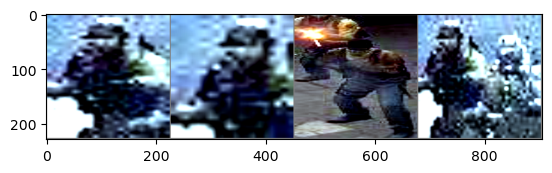

Real labels:     ct    ct     t    ct
Predicted:     ct    ct     t    ct


In [21]:
# these functions visualize the results of the model and compare with ground truth
def imageshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def visualize_preds(model):
    # get batch of images from the test DataLoader  
    images, labels = next(iter(dataloaders['test']))
    images = images.to(device)
    labels = labels.to(device)

    # show all images as one image grid
    imageshow(torchvision.utils.make_grid(images.cpu()))
   
    # show the real labels  
    print('Real labels: ', ' '.join('%5s' % image_datasets['test'].classes[labels[j]] 
                               for j in range(4)))

    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    
    # show the predicted labels 
    print('Predicted: ', ' '.join('%5s' % image_datasets['test'].classes[predicted[j]] 
                              for j in range(4)))

torch.manual_seed(143)    
    
# Visualize Model Results
visualize_preds(model_conv)

In [22]:
# Save trained model
torch.save(model_conv.state_dict(), './csgo.pt')

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">Double Kill (Integrating the Two Models)</h2>

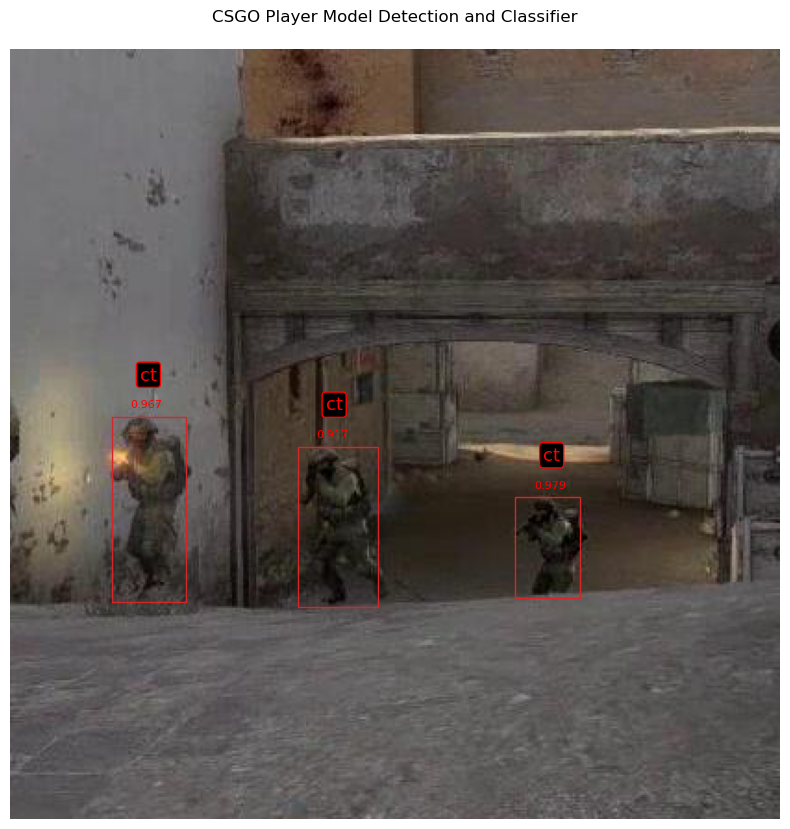

In [23]:
# If existing, delete dir to reset
face_recog_dir = 'data/face_recog'
if os.path.exists(face_recog_dir):
    shutil.rmtree(face_recog_dir)
    
# Create destination directory
os.makedirs(f"{face_recog_dir}/test/model")

image_filepath = './data1/test/704_jpg.rf.a91b8cb8a4159eb47ced84049a7ee088.jpg'
image = Image.open(image_filepath)

feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-tiny')
model = YolosForObjectDetection.from_pretrained('hustvl/yolos-tiny')

inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)

# model predicts bounding boxes and corresponding COCO classes
logits = outputs.logits
bboxes = outputs.pred_boxes

target_sizes = torch.tensor([image.size[::-1]])
results = feature_extractor.post_process_object_detection(outputs, 
                                            target_sizes=target_sizes)[0]

confidence = 0.8

player = {'labels': [], 'scores': [], 'boxes': []}

for score, label, box in zip(results["scores"], results["labels"], 
                             results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    # let's only keep detections with score > 0.5
    if score > confidence:
        label_name = model.config.id2label[label.item()]
        if label_name == 'person':
            player['labels'].append(label_name)
            player['scores'].append(round(score.item(), 3))
            player['boxes'].append(box)



for index2, box in enumerate(player['boxes']):
    if player['scores'][index2] > confidence:
        x = image.crop(box)
        x.save(f"./{face_recog_dir}/test/model/sample_{index2}.jpg", format='jpeg')
    
# loading cropped image data using ImageFolder
face_datasets = datasets.ImageFolder(os.path.join(face_recog_dir, 'test'),
                                     data_transforms['test'])

# Cropped Image Dataloaders
face_dataloaders = DataLoader(face_datasets, batch_size=len(player['boxes']), 
                              shuffle=False)


# Get batch of images from the test DataLoader
images, _ = next(iter(face_dataloaders))
images = images.to(device)

# Predicts the images using the trained model
outputs = model_conv(images)
_, predicted = torch.max(outputs, 1)

# Gets the class labels from the predictions
names = [team[i] for i in predicted]

# Plot the image
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image)

# Loop for all the faces detected by the model
for index, box in enumerate(player['boxes']):
    x1, y1, x2, y2 = box
    width = x2 - x1
    height = y2 - y1
    rectangle = Rectangle((x1, y1), width, height, fill=False, ec='tab:red')
    ax.text(x1+10, y1-5, player['scores'][index], fontsize=8, color='red')
    ax.add_patch(rectangle)
    
    # Add the face labels
    bbox_props = dict(boxstyle="round,pad=0.2", fc="black", ec="red")
    ax.text(x1+15, y1-20, names[index], fontsize=13, color='red', bbox=bbox_props)
    
# Adds context to the image
ax.set_title(f'CSGO Player Model Detection and Classifier', pad=20)
ax.set_axis_off()
plt.show()

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">End of Round</h2>

In conclusion, a two-step model was performed on the CSGO image dataset. The first is a player model detection model that identifies a player, sets a bounding box and indicates the confidence level of the model. The model used is YOLO which is a known object detection model. The model was able to successfully detect most players in the whole dataset and can even detect even if only portion of the body is show. However the model also was unable to predict some obvious player models and there are images where the model detects the same model more than once. The next model is a classification model where the model predicts if the player model belongs to the team of csgo which is counter-terrorists (ct) and terrorists (t). The model is able to achieve a higher accuracy than the baseline accuracy which is the PCC. 

The model has a very high impact on the game of CSGO. One is upskilling of players by improving the AI or bots. Beginner players are usually competing with AI players to familiarize themselves with the game so improving the detection algorithm of the bots can help players get accustomed to quicker pace of the game since the bots will be able to accurately predict even if the player shows only a part of the body during the game. Improving the bots can also lead to high skill players being encourage to practice with the AI players if it can pose a challenge to them since accurate and quick detection is key in the game of CSGO.

Another use of this model is to integrate the model to the strategy of players and even professional players. By identifying which locations the model is having difficulty in detecting the player model is a great advantage to teams. If the AI is having a hard time detecting a player in a non-obvious location, this usually means that players will also have the same pain point. 

Last is cheat detection since if trained to an optimal level, it is safe to say that AI should be the ceiling on player model detection. If a specific player constantly detects a player model more accurately than the optimal AI, it should send a red flag that the player has an unfair advantage by using cheats or mods that are not usually allowed in the game. That being said, the AI should be optimized very well to achieve the highest possible accuracy.

The integration of AI in gaming has revolutionized the industry, enhancing gameplay, game development, and player engagement. As AI technologies continue to advance, more innovative applications can be expected. These applications will shape the future of gaming, providing new and exciting experiences for players worldwide.

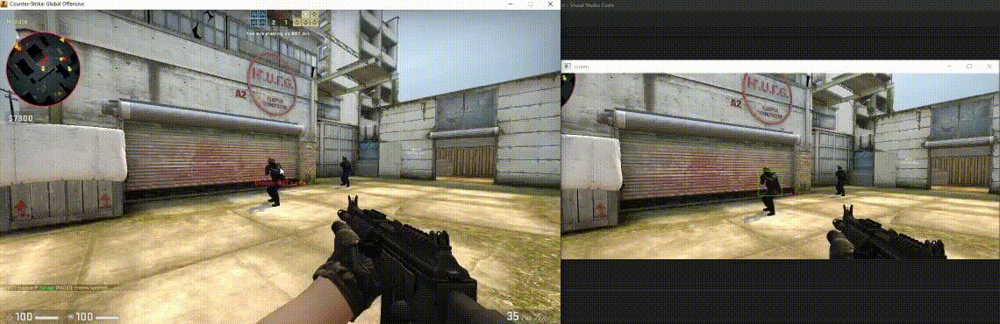

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">Continue?</h2>

Player detection is just a start in CSGO or any shooter games. One can also detect specific body parts which are critical such as head since aiming at the head will result to the highest damage to a player. Other body parts are the first one that can be seen when encountering players such as feet and arms. Classifying the gun that the player is using is also impactful since if the model can correctly identify, it can be integrated such that the bot can know what strategy it will use with a specific firearm. 

<h2 style="color:#FFCF64; background-color: #3370AC; border: 1px solid #3370AC; padding: 10px 0;">References</h2>

[1] Valve Corporation. (2023) Counter-Strike: Global Offensive. Retrieved from  https://store.steampowered.com/app/730/CounterStrike_Global_Offensive/

[2] Yuxin Fang, et al. (Oct 27 2021) You Only Look at One Sequence: Rethinking Transformer in Vision through Object Detection. Retrieved from https://arxiv.org/abs/2106.00666

[3] Aakash Kaushik (n.d.) Understanding the VGG19 Architecture. Retrieved from https://iq.opengenus.org/vgg19-architecture/

[4] OpenAI. (2023). ChatGPT (Mar 14 version) [Large language model]. https://chat.openai.com/chat